#Dataset download and save in drive

In [1]:
!wget http://images.cocodataset.org/zips/val2014.zip --verbose

--2022-01-04 11:24:39--  http://images.cocodataset.org/zips/val2014.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 54.231.139.225
Connecting to images.cocodataset.org (images.cocodataset.org)|54.231.139.225|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6645013297 (6.2G) [application/zip]
Saving to: ‘val2014.zip’

val2014.zip         100%[===================>]   6.19G  46.9MB/s    in 2m 16s  

2022-01-04 11:26:55 (46.6 MB/s) - ‘val2014.zip’ saved [6645013297/6645013297]



In [2]:
!unzip val2014.zip -d /content/CocoVal2014

Streaming output truncated to the last 5000 lines.
 extracting: /content/CocoVal2014/val2014/COCO_val2014_000000535608.jpg  
 extracting: /content/CocoVal2014/val2014/COCO_val2014_000000279145.jpg  
 extracting: /content/CocoVal2014/val2014/COCO_val2014_000000243495.jpg  
 extracting: /content/CocoVal2014/val2014/COCO_val2014_000000225791.jpg  
 extracting: /content/CocoVal2014/val2014/COCO_val2014_000000428067.jpg  
 extracting: /content/CocoVal2014/val2014/COCO_val2014_000000059383.jpg  
 extracting: /content/CocoVal2014/val2014/COCO_val2014_000000558498.jpg  
 extracting: /content/CocoVal2014/val2014/COCO_val2014_000000376123.jpg  
 extracting: /content/CocoVal2014/val2014/COCO_val2014_000000191304.jpg  
 extracting: /content/CocoVal2014/val2014/COCO_val2014_000000171062.jpg  
 extracting: /content/CocoVal2014/val2014/COCO_val2014_000000014549.jpg  
 extracting: /content/CocoVal2014/val2014/COCO_val2014_000000121152.jpg  
 extracting: /content/CocoVal2014/val2014/COCO_val2014_000000

In [3]:
!rm /content/val2014.zip

# Dataset prepratation

In [4]:
DATASET_PATH = '/content/CocoVal2014'

In [5]:
import os
from PIL import Image
from tqdm import tqdm

min_height = float('inf')
min_width = float('inf')
for subdir, dirs, files in os.walk(DATASET_PATH):
    for file in tqdm(files):
        filepath = subdir + os.sep + file
        image = Image. open(filepath)
        width, height = image.width, image.height
        if height < min_height:
          min_height = height
        if width < min_width:
          min_width = width

print(f"min width is : {min_width}, and min height is : {min_height}")

0it [00:00, ?it/s]
100%|██████████| 40504/40504 [00:33<00:00, 1217.94it/s]

min width is : 120, and min height is : 111


In [6]:
import os

FINAL_PATH = '/content/CocoVal2014-modified'

if not os.path.exists(FINAL_PATH):
  os.makedirs(FINAL_PATH)

In [7]:
import os
from PIL import Image
from tqdm import tqdm

for subdir, dirs, files in os.walk(DATASET_PATH):
    for file in tqdm(files):
        filepath = subdir + os.sep + file
        image = Image. open(filepath)
        new_image = image.resize((64, 64))
        new_image.save(FINAL_PATH + os.sep + file)

0it [00:00, ?it/s]
100%|██████████| 40504/40504 [05:40<00:00, 118.95it/s]


In [8]:
!rm -rf /content/CocoVal2014

# Model

In [9]:
FINAL_PATH = '/content/CocoVal2014-modified'

In [10]:
!nvidia-smi

Tue Jan  4 11:35:34 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [11]:
import cv2
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision
import torch.nn as nn
from torchvision import transforms
import torch.nn.functional as F
from torchvision.utils import save_image

In [12]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [13]:
class depthwise_separable_conv(nn.Module):
    def __init__(self, nin, kernels_per_layer, nout):
        super(depthwise_separable_conv, self).__init__()
        self.depthwise = nn.Conv2d(nin, nin * kernels_per_layer, kernel_size=5, padding=2, groups=nin)
        self.pointwise = nn.Conv2d(nin * kernels_per_layer, nout, kernel_size=1)

    def forward(self, x):
        out = self.depthwise(x)
        out = self.pointwise(out)
        return out

In [14]:
def swish(x):
    return x * torch.sigmoid(x)

In [15]:
class ChannelSELayer(nn.Module):
    def __init__(self, num_channels, reduction_ratio=2):
        super(ChannelSELayer, self).__init__()
        num_channels_reduced = num_channels // reduction_ratio
        self.reduction_ratio = reduction_ratio
        self.fc1 = nn.Linear(num_channels, num_channels_reduced, bias=True)
        self.fc2 = nn.Linear(num_channels_reduced, num_channels, bias=True)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def forward(self, input_tensor):
        batch_size, num_channels, H, W = input_tensor.size()
        squeeze_tensor = input_tensor.view(batch_size, num_channels, -1).mean(dim=2)

        fc_out_1 = self.relu(self.fc1(squeeze_tensor))
        fc_out_2 = self.sigmoid(self.fc2(fc_out_1))

        a, b = squeeze_tensor.size()
        output_tensor = torch.mul(input_tensor, fc_out_2.view(a, b, 1, 1))
        return output_tensor

In [16]:
class dec_res(nn.Module):
  def __init__(self,in_channel):
    super(dec_res,self).__init__()
    self.bn1 = nn.BatchNorm2d(in_channel)
    self.c1 = nn.Conv2d(in_channels=in_channel,out_channels=2*in_channel,kernel_size=1,stride=1,padding=0)
    self.bn2 = nn.BatchNorm2d(2*in_channel)
    self.dc1 = depthwise_separable_conv(nin=2*in_channel,kernels_per_layer=3,nout=2*in_channel)
    self.bn3 = nn.BatchNorm2d(2*in_channel)
    self.c2 = nn.Conv2d(in_channels=2*in_channel,out_channels=in_channel,kernel_size=1,stride=1,padding=0)
    self.bn4 = nn.BatchNorm2d(in_channel)
    self.SE = ChannelSELayer(in_channel)
  def forward(self,x1):
    x = self.c1(self.bn1(x1))
    x = swish(self.bn2(x))
    x = self.dc1(x)
    x = swish(self.bn3(x))
    x = self.bn4(self.c2(x))
    x = self.SE(x)
    return x+x1

class enc_res(nn.Module):
  def __init__(self,in_channel):
    super(enc_res,self).__init__()
    self.bn1 = nn.BatchNorm2d(in_channel)
    self.c1 = nn.Conv2d(in_channels=in_channel,out_channels=2*in_channel,kernel_size=3,stride=1,padding=1)
    self.bn2 = nn.BatchNorm2d(2*in_channel)
    self.c2 = nn.Conv2d(in_channels=2*in_channel,out_channels=in_channel,kernel_size=3,stride=1,padding=1)
    self.bn3 = nn.BatchNorm2d(in_channel)
    self.SE = ChannelSELayer(in_channel)
  def forward(self,x1):
    x = self.c1(swish(self.bn1(x1)))
    x = self.c2(swish(self.bn2(x)))
    x = self.SE(x)
    return x+x1

In [17]:
class NVAE(nn.Module):
  def __init__(self,start_channel,original_dim):
    super(NVAE,self).__init__()
    self.original_dim = original_dim
    self.conv1 = nn.Conv2d(in_channels=start_channel,out_channels=8,kernel_size=3,stride=1,padding=1)
    self.encblock1 = enc_res(8)
    self.dsconv1 = nn.Conv2d(in_channels=8,out_channels=8,kernel_size=2,stride=2,padding=0)
    self.encblock2 = enc_res(8)
    self.dsconv2 = nn.Conv2d(in_channels=8,out_channels=8,kernel_size=2,stride=2,padding=0)

    self.qmu1 = nn.Linear(original_dim*original_dim*2,original_dim*original_dim*2)
    self.qvar1 = nn.Linear(original_dim*original_dim*2,original_dim*original_dim*2)
    
    self.qmu0 = nn.Linear(original_dim*original_dim//2,original_dim*original_dim//2)
    self.qvar0 = nn.Linear(original_dim*original_dim//2,original_dim*original_dim//2)

    self.pmu1 = nn.Linear(original_dim*original_dim*2,original_dim*original_dim*2)
    self.pvar1 = nn.Linear(original_dim*original_dim*2,original_dim*original_dim*2)

    self.decblock1 = dec_res(8)
    self.usconv1 = nn.ConvTranspose2d(in_channels=8,out_channels=8,kernel_size=2,stride=2,padding=0)
    self.decblock2 = dec_res(16)
    self.usconv2 = nn.ConvTranspose2d(in_channels=16,out_channels=16,kernel_size=2,stride=2,padding=0)
    self.decblock3 = dec_res(16)
    self.finconv = nn.Conv2d(in_channels=16,out_channels=start_channel,kernel_size=3,stride=1,padding=1)
  
  def forward(self,x):
    z1 = self.dsconv1(self.encblock1(self.conv1(x)))
    z0 = self.dsconv2(self.encblock2(z1))

    qmu0 = self.qmu0(z0.reshape(z0.shape[0],self.original_dim*self.original_dim//2))
    qvar0 = self.qvar0(z0.reshape(z0.shape[0],self.original_dim*self.original_dim//2))

    qmu1 = self.qmu1(z1.reshape(z1.shape[0],self.original_dim*self.original_dim*2))
    qvar1 = self.qvar1(z1.reshape(z1.shape[0],self.original_dim*self.original_dim*2))

    stdvar0 = qvar0.mul(0.5).exp_()
    stdvar1 = qvar1.mul(0.5).exp_()

    e0 = torch.randn(qmu0.shape).to(device)
    ez0 = qmu0+e0*stdvar0
    ez0 = ez0.reshape(ez0.shape[0],8,self.original_dim//4,self.original_dim//4)
    ez1 = self.usconv1(self.decblock1(ez0))

    pmu1 = self.pmu1(ez1.reshape(ez1.shape[0],self.original_dim*self.original_dim*2))
    pvar1 = self.pvar1(ez1.reshape(ez1.shape[0],self.original_dim*self.original_dim*2))

    pstdvar1 = pvar1.mul(0.5).exp_()

    e2 = torch.randn(qmu1.shape).to(device)
    ez2 = pmu1+qmu1 + e2*pstdvar1*stdvar1
    ez2 = ez2.reshape(ez2.shape[0],8,self.original_dim//2,self.original_dim//2)
    
    final = torch.cat((ez1,ez2),1)

    recons = nn.Sigmoid()(self.finconv(self.decblock3(self.usconv2(self.decblock2(final)))))

    return qmu0,qvar0,qmu1,qvar1,pmu1,pvar1,recons

  def sample(self,bs):
    e = torch.randn([bs,8,self.original_dim//4,self.original_dim//4]).to(device)
    ez1 = self.usconv1(self.decblock1(e))

    pmu1 = self.pmu1(ez1.reshape(ez1.shape[0],self.original_dim*self.original_dim*2))
    pvar1 = self.pvar1(ez1.reshape(ez1.shape[0],self.original_dim*self.original_dim*2))

    stdvar1 = pvar1.mul(0.5).exp_()

    e1 = torch.randn([ez1.shape[0],self.original_dim*self.original_dim*2]).to(device)
    e1 = pmu1 + e1*stdvar1
    e1 = e1.reshape(e1.shape[0],8,self.original_dim//2,self.original_dim//2)
    recons = nn.Sigmoid()(self.finconv(self.decblock3(self.usconv2(self.decblock2(torch.cat((ez1,e1),1))))))

    return recons

  def loss(self,x):
    qmu0,qvar0,qmu1,qvar1,pmu1,pvar1,recons = self.forward(x)
    klz0 = 0.5*torch.sum(torch.square(qmu0)+qvar0.exp()-qvar0-1)/x.shape[0]
    klz1 = 0.5*torch.sum(torch.square(qmu1)/pvar1.exp()+qvar1.exp()-qvar1-1)
    reconsloss = nn.BCELoss()(recons,x)
    return klz0,klz1,reconsloss

In [18]:
batch_size=64

In [19]:
transform = transforms.Compose([transforms.ToTensor()])

In [20]:
from os import listdir
from PIL import Image

class CocoDataloader(object):
    def __init__(self, data_dir, transform=None):
        self.transform = transform
        self.image_names = [os.path.join(data_dir, img) for img in listdir(data_dir) if os.path.join(data_dir, img)]

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):

        image = Image.open(self.image_names[idx]).convert('L')

        if self.transform:
            image = self.transform(image)

        return image

In [21]:
from torch.utils.data import DataLoader

train = CocoDataloader(FINAL_PATH,
                                transform=transforms.Compose([transforms.ToTensor()]))
loader = DataLoader(train, batch_size=batch_size, shuffle=True, num_workers=2)

In [22]:
model = NVAE(1,64).to(device)
optim = torch.optim.Adamax(model.parameters())
epochs = 50

epoch: 0 kl0_loss: 702.3768228963738 recons_loss: 0.5659183243529824 kl1_loss: 59698967.07132166
epoch: 1 kl0_loss: 4687.274350122056 recons_loss: 0.8406926368197833 kl1_loss: 89357.30890585748
epoch: 2 kl0_loss: 2644.3618466405323 recons_loss: 0.6747108439718243 kl1_loss: 521.8566997301289
epoch: 3 kl0_loss: 1157.5576881199233 recons_loss: 0.6601923786437773 kl1_loss: 489.95692364585136
epoch: 4 kl0_loss: 551.6224115512222 recons_loss: 0.659244651983266 kl1_loss: 484.2701536205336
epoch: 5 kl0_loss: 273.50812945063586 recons_loss: 0.6561427117335851 kl1_loss: 280.151509257284
epoch: 6 kl0_loss: 138.25097971943887 recons_loss: 0.6489599065867286 kl1_loss: 142.2024832719309
epoch: 7 kl0_loss: 71.89889352697877 recons_loss: 0.6425286372047437 kl1_loss: 72.06537803199342
epoch: 8 kl0_loss: 38.178539964395995 recons_loss: 0.6368650748704748 kl1_loss: 38.68027881386486
epoch: 9 kl0_loss: 22.68801510505895 recons_loss: 0.6325194652834453 kl1_loss: 18.732424989180817
epoch: 10 kl0_loss: 16.33

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


epoch: 20 kl0_loss: 8.4345425655313 recons_loss: 0.6297992360396464 kl1_loss: 0.40109702597464025
epoch: 21 kl0_loss: 8.155241016152111 recons_loss: 0.6301571660283853 kl1_loss: 2.375899154773089
epoch: 22 kl0_loss: 7.768446218960374 recons_loss: 0.6271771433771116 kl1_loss: 0.9278582182828555
epoch: 23 kl0_loss: 7.355178346470036 recons_loss: 0.6223609680694341 kl1_loss: 0.897570450362918
epoch: 24 kl0_loss: 7.099728796855513 recons_loss: 0.6211875722786431 kl1_loss: 1.4306468469880442
epoch: 25 kl0_loss: 6.934711864478216 recons_loss: 0.6206733226988029 kl1_loss: 0.2238063948876816
epoch: 26 kl0_loss: 6.8176964090766585 recons_loss: 0.6206205242381321 kl1_loss: 1.0422583765694446
epoch: 27 kl0_loss: 6.665494498494536 recons_loss: 0.6205147073223213 kl1_loss: 0.45241223826324567
epoch: 28 kl0_loss: 6.525743691506368 recons_loss: 0.6208135769839535 kl1_loss: 0.40041069583696925
epoch: 29 kl0_loss: 6.322724288098077 recons_loss: 0.621246502989487 kl1_loss: 0.6141429080420183
epoch: 30 k

<Figure size 432x288 with 0 Axes>

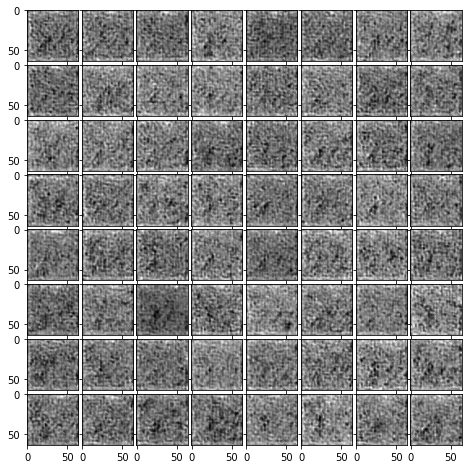

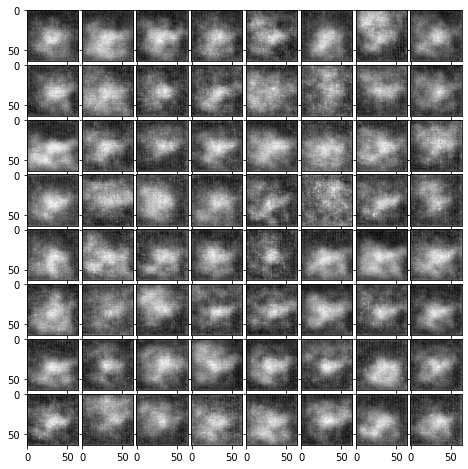

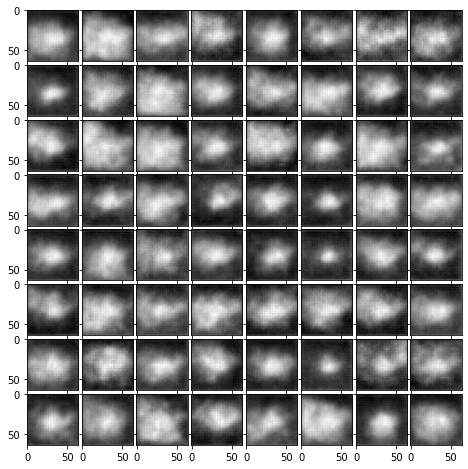

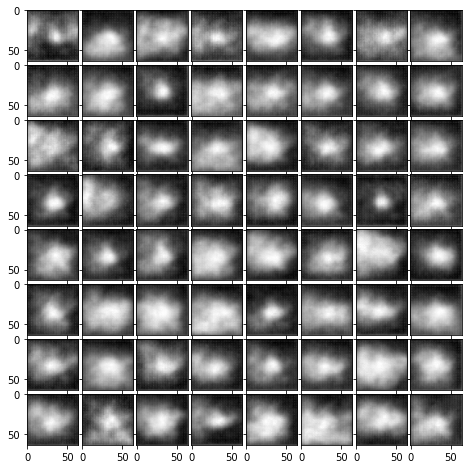

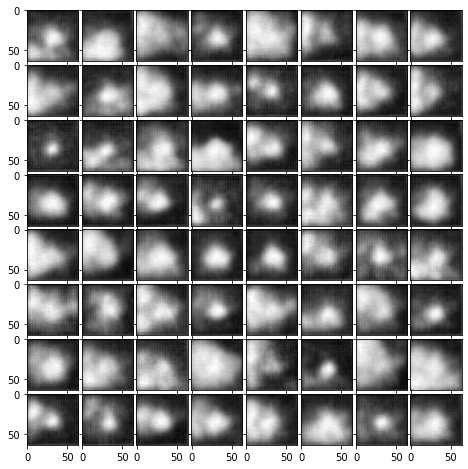

...

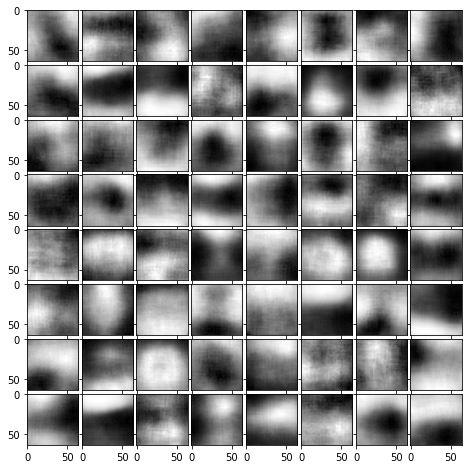

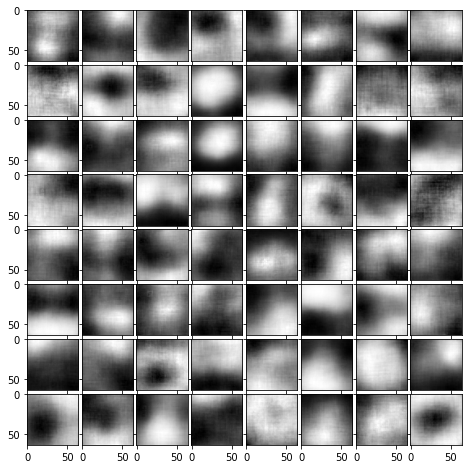

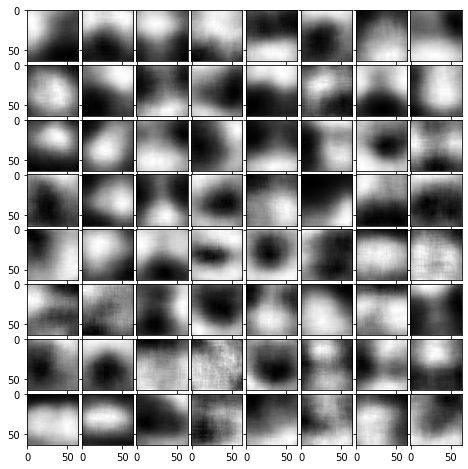

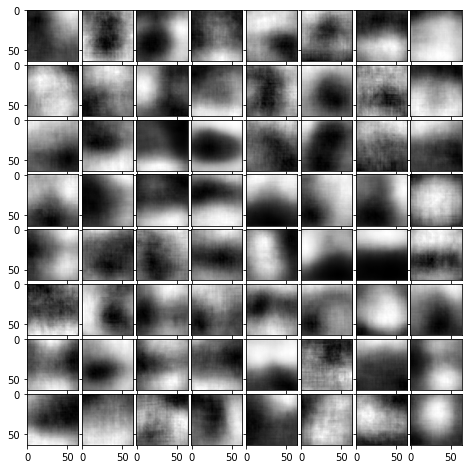

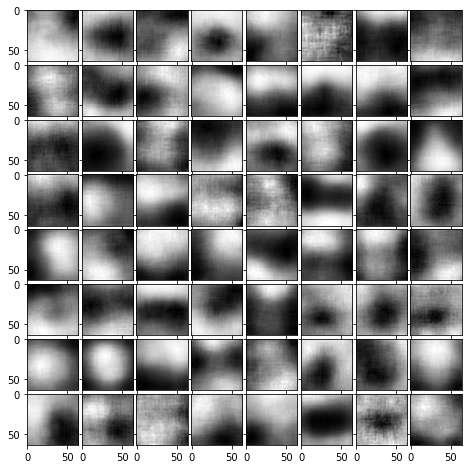

In [23]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

for epoch in range(epochs):
    minloss = 1
    running_kl0_loss=0
    running_recons_loss=0
    running_kl1_loss=0
    num_images=0
    for i, img in enumerate(loader):
      img = img.to(device)
      optim.zero_grad()
      klz0,klz1,recons = model.loss(img)
      loss=recons+epoch*0.0001*klz0+epoch*0.0001*klz1
      loss.backward()
      optim.step()
      running_kl0_loss = running_kl0_loss + klz0.item()*len(img)
      running_kl1_loss = running_kl1_loss + klz1.item()*len(img)
      running_recons_loss = running_recons_loss + recons.item()*len(img)

      num_images= num_images+len(img)
    print('epoch: '+str(epoch)+' kl0_loss: '+str(running_kl0_loss/num_images)+' recons_loss: '+str(running_recons_loss/num_images)+' kl1_loss: '+str(running_kl1_loss/num_images))
    imgs = model.sample(64).cpu().detach().reshape(64, 64, 64)
    plt.gray()
    fig = plt.figure(figsize=(8., 8.))
    grid = ImageGrid(fig, 111, nrows_ncols=(8, 8), axes_pad=0.05)

    for ax, im in zip(grid, imgs):
        ax.imshow(im)
    plt.savefig(str(epoch)+".png")

In [ ]:
import gc

gc.collect()

torch.cuda.empty_cache()

In [ ]:
img[25].shape

In [ ]:
img.shape

(64, 64, 3)